In [ ]:
%matplotlib inline
import os
import librosa
import IPython.display as ipd

In [2]:
dataset_name = 'test'

In [3]:
dataset_path = f'../data/processed/{dataset_name}'.replace('\\', '/')
sample = os.listdir(dataset_path)[1].split('.')[0]
sample_audio = f'{dataset_path}/{sample}.mp3'.replace('\\', '/')
sample_annotations = f'{dataset_path}/{sample}.txt'.replace('\\', '/')
print(sample_audio)
print(sample_annotations)

../data/processed/test/OLDCODEX - Rage on _TV Size_ annotated by Konei.mp3
../data/processed/test/OLDCODEX - Rage on _TV Size_ annotated by Konei.txt


In [4]:
x, sr = librosa.load(sample_audio)
ipd.Audio(x, rate=sr)

In [5]:
with open(sample_annotations, 'r') as f: beats = [(float(beat.split(' ')[0]), bool(beat.split(' ')[2])) for beat in f.readlines()]

In [6]:
# Check definite beats
clicks = librosa.clicks([beat[0] for beat in beats if beat[1] == True], sr=sr, length=len(x))
ipd.Audio(x + clicks, rate=sr)

In [7]:
# Check definite beats
clicks = librosa.clicks([beat[0] for beat in beats], sr=sr, length=len(x))
ipd.Audio(x + clicks, rate=sr)

In [8]:
import random

In [39]:
is_downbeat = True

beat_idx = random.randint(0, len(beats) - 1)
if is_downbeat:
    while beats[beat_idx][1] != 1: beat_idx = random.randint(0, len(beats) - 1)
    
beat_position = beats[beat_idx][0] * sr
window_size = 1 * sr  # Window size of 1 sec

In [23]:
import src.features as features
import matplotlib.pyplot as plt
import numpy as np

In [40]:
x_slice = x[int(max(beat_position - window_size, 0)):int(min(beat_position + window_size, len(x)))]
print(int(max(beat_position - window_size, 0)))
print(int(min(beat_position + window_size, len(x))))
print(x_slice.shape)

365268
409368
(44100,)


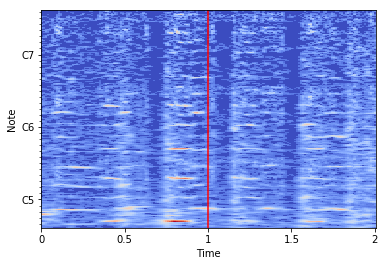

In [41]:
q, f = features.extract_melody_cqt(x_slice, sr, plot=True)
plt.axvline(x=1, color='r')